## Workbook 01_Topic_Modelling
This workbook contains the pre-processing of our Steam Reviews dataset and our three models (LDA, BERTopic, NMF) for Topic Modelling

The result of this workbook is a .csv file named 'topic_modelling.csv' to be imported into the next workbook 02_Finalizing_Topic_DF.

This workbook also produces a larger .csv file named 'steam_df.csv' to be used to test the accuracy scores in 03_Sentiment_Analysis. These codes are commented.

### Importing Packages

In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

import re

import json
import bbcode
from nltk.corpus import stopwords

import gensim
import nltk
from nltk import bigrams, trigrams
from gensim.corpora import Dictionary

import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

from nltk.stem.porter import *
from nltk.stem import WordNetLemmatizer
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer
from gensim.models.coherencemodel import CoherenceModel

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF

from bertopic import BERTopic

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

/Users/deborahhow/opt/anaconda3/envs/is217_env/lib/python3.11/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:13: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm, trange


### Importing Dataset

In [3]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)


    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df


def import_data(file):
    """create a dataframe and optimize its memory usage"""
    df = pd.read_csv(file, parse_dates=True, keep_date_col=True)
    df = reduce_mem_usage(df)
    return df

def import_data_small(file):
    """create a dataframe and optimize its memory usage"""
    df = pd.read_csv(file, parse_dates=True, keep_date_col=True, nrows=1000000)
    df = reduce_mem_usage(df)
    return df

In [4]:
# This code takes over a minute to run
steam_reviews = import_data_small('OW2_100000_1729066055.csv')
steam_reviews.info()

Memory usage of dataframe is 14.31 MB
Memory usage after optimization is: 8.77 MB
Decreased by 38.7%
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   recommendationid                100000 non-null  int32  
 1   author                          100000 non-null  object 
 2   language                        100000 non-null  object 
 3   review                          99844 non-null   object 
 4   timestamp_created               100000 non-null  int32  
 5   timestamp_updated               100000 non-null  int32  
 6   voted_up                        100000 non-null  float16
 7   votes_up                        100000 non-null  int32  
 8   votes_funny                     100000 non-null  int16  
 9   weighted_vote_score             100000 non-null  float16
 10  comment_count                   100000 n

## 1. Data Preprocessing
### Filtering data
- Remove unwanted columns and entries with NA values
- Filter reviews from players that would most likely give higher value insights (length - more than 4 words, playtime - more than 3 hours)
- Get rid of duplicate reviews
- Focus on English reviews only
- Filter further down to top 10 games only

In [5]:
# Remove entries with NA values
steam_reviews = steam_reviews[steam_reviews['review'].notna()]

In [6]:

steam_reviews = steam_reviews[(steam_reviews['language'] == 'english')]

In [7]:
steam_reviews.info()
steam_reviews.head()

<class 'pandas.core.frame.DataFrame'>
Index: 99844 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   recommendationid                99844 non-null  int32  
 1   author                          99844 non-null  object 
 2   language                        99844 non-null  object 
 3   review                          99844 non-null  object 
 4   timestamp_created               99844 non-null  int32  
 5   timestamp_updated               99844 non-null  int32  
 6   voted_up                        99844 non-null  float16
 7   votes_up                        99844 non-null  int32  
 8   votes_funny                     99844 non-null  int16  
 9   weighted_vote_score             99844 non-null  float16
 10  comment_count                   99844 non-null  int16  
 11  steam_purchase                  99844 non-null  float16
 12  received_for_free               99844

,recommendationid,author,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,...,hidden_in_steam_china,steam_china_location,primarily_steam_deck,author.steamid,author.num_games_owned,author.num_reviews,author.playtime_forever,author.playtime_last_two_weeks,author.playtime_at_review,author.last_played
0,154514297,"{'steamid': '76561199584850685', 'num_games_ow...",english,"Alright, let's actually provide a constructive...",1703654522,1703654522,0.0,4976,76,0.970703,...,1.0,NaN,0.0,76561199584850685,20,11,13,0,13,1703654457
1,163018004,"{'steamid': '76561198003147811', 'num_games_ow...",english,Made Overwatch 2 because of PvE.\nScrapped PvE...,1713315021,1713315021,0.0,3786,59,0.966797,...,1.0,NaN,0.0,76561198003147811,452,12,651,0,651,1694337343
2,143933839,"{'steamid': '76561198257048334', 'num_games_ow...",english,"I cried at the part when Reaper said ""BUY, BUY...",1691792190,1691792190,0.0,11659,3019,0.965820,...,1.0,NaN,0.0,76561198257048334,143,39,1625,66,106,1728422067
3,145025464,"{'steamid': '76561198006275159', 'num_games_ow...",english,According to the game director for this game b...,1693013177,1693013177,0.0,2382,47,0.962891,...,1.0,NaN,0.0,76561198006275159,1028,22,40,0,40,1693012872
4,160827846,"{'steamid': '76561198091551412', 'num_games_ow...",english,"Alright, let's actually provide a constructive...",1710747277,1710747277,0.0,2179,28,0.961914,...,1.0,NaN,0.0,76561198091551412,228,11,17522,137,6331,1729060285


In [8]:
# Removing unwanted columns
steam_reviews.drop(columns=['author', 'recommendationid','votes_funny', 'votes_up', 'weighted_vote_score',
                            'steam_purchase', 'received_for_free', 'written_during_early_access','hidden_in_steam_china',
                            'steam_china_location','primarily_steam_deck','author.num_games_owned','author.num_reviews',
                            'author.playtime_forever','author.playtime_last_two_weeks','author.last_played'], inplace=True)
steam_reviews.reset_index(drop=True, inplace=True)

In [9]:
steam_reviews.head()

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review
0,english,"Alright, let's actually provide a constructive...",1703654522,1703654522,0.0,86,76561199584850685,13
1,english,Made Overwatch 2 because of PvE.\nScrapped PvE...,1713315021,1713315021,0.0,0,76561198003147811,651
2,english,"I cried at the part when Reaper said ""BUY, BUY...",1691792190,1691792190,0.0,0,76561198257048334,106
3,english,According to the game director for this game b...,1693013177,1693013177,0.0,0,76561198006275159,40
4,english,"Alright, let's actually provide a constructive...",1710747277,1710747277,0.0,39,76561198091551412,6331


In [10]:
# Add new column with review_length
review_lengths = [len(x.split()) for x in steam_reviews['review']]
print(len(review_lengths))
print(sum(review_lengths)/len(review_lengths)) # mean character length of a review
steam_reviews['review_length']=steam_reviews['review'].map(lambda x: len(x.split()))

99844
33.70201514362405


In [11]:
steam_reviews['review_length'].describe()

count    99844.000000
mean        33.702015
std         97.303598
min          0.000000
25%          3.000000
50%          8.000000
75%         23.000000
max       1849.000000
Name: review_length, dtype: float64

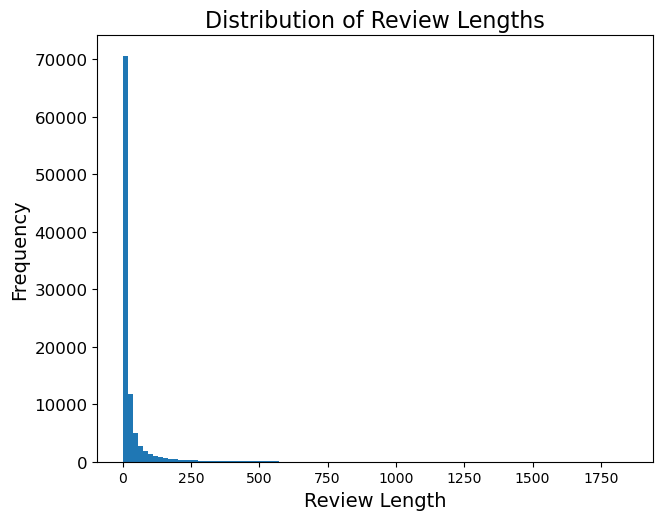

<Figure size 1000x1000 with 0 Axes>

In [12]:
plt.hist(steam_reviews['review_length'], bins=100)
plt.tight_layout()
plt.yticks(fontsize=12) 

plt.xlabel('Review Length', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Distribution of Review Lengths', fontsize=16)
plt.figure(figsize=(10, 10))

plt.show()

In [13]:
#cut off review lengths at the 25th percentile. 
#Short reviews contain too little info, but we can't discard too much data either.
np.percentile(steam_reviews['review_length'],30) # If more than 3.0 words

steam_reviews_filtered = steam_reviews[steam_reviews['review_length'] > np.percentile(steam_reviews['review_length'],30)].reset_index(drop=True) 
#Remove very short reviews that are likely to be junk

print('Min length:',min(steam_reviews_filtered['review_length']),'words') #shortest review length.

Min length: 5 words


In [14]:
steam_reviews_filtered['review'].value_counts()

review
....................../´¯/)\n....................,/¯../\n.................../..../\n............./´¯/'...'/´¯¯`·¸\n........../'/.../..../......./¨¯\\n........('(...´...´.... ¯~/'...')\n.........\.................'...../\n..........''...\.......... _.·´\n............\..............(\n..............\.............\..                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [15]:
mask = steam_reviews_filtered['review'] == '▒█▀▀█ ▒█▀▀▀ ▒█▀▀█ ▀█▀ ▒█▀▀▀█ ▒█▄░▒█\n▒█▄▄▀ ▒█▀▀▀ ▒█░▄▄ ▒█░ ▒█░░▒█ ▒█▒█▒█\n▒█░▒█ ▒█▄▄▄ ▒█▄▄█ ▄█▄ ▒█▄▄▄█ ▒█░░▀█\n\n▒█░░░ ▒█▀▀▀█ ▒█▀▀█ ▒█░▄▀\n▒█░░░ ▒█░░▒█ ▒█░░░ ▒█▀▄░\n▒█▄▄█ ▒█▄▄▄█ ▒█▄▄█ ▒█░▒█\n\n▒█▀▀█ ▒█░▒█ ▀█▀ ▒█▄░▒█ ░█▀▀█\n▒█░░░ ▒█▀▀█ ▒█░ ▒█▒█▒█ ▒█▄▄█\n▒█▄▄█ ▒█░▒█ ▄█▄ ▒█░░▀█ ▒█░▒█'

steam_reviews_filtered.drop(steam_reviews_filtered[mask].index, inplace=True)

from langdetect import detect, LangDetectException

# Function to detect if the review is in English
def is_english(text):
    try:
        return detect(text) == 'en'
    except LangDetectException:
        return False  # If the language detection fails, return False

# Apply the function to the 'review' column and create a new column 'is_english'
steam_reviews_filtered['is_english'] = steam_reviews_filtered['review'].apply(is_english)

# Filter the reviews that are in English
steam_reviews_filtered.drop(steam_reviews_filtered[steam_reviews_filtered['is_english'] == False].index, inplace=True)

In [16]:
steam_reviews['timestamp_created'].dtype

dtype('int32')

In [17]:
# Filter reviews that have more than 3 hours of playtime when written
minimum_playtime = 180 # playtime is recorded in minutes
steam_reviews_filtered = steam_reviews_filtered[steam_reviews_filtered['author.playtime_at_review'] >= minimum_playtime].reset_index(drop=True)

In [18]:
steam_reviews_filtered.drop(columns=['is_english'], inplace=True)
steam_reviews_filtered.head()

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,review_length
0,english,Made Overwatch 2 because of PvE.\nScrapped PvE...,1713315021,1713315021,0.0,0,76561198003147811,651,27
1,english,"Alright, let's actually provide a constructive...",1710747277,1710747277,0.0,39,76561198091551412,6331,1392
2,english,I have over 300 hours in Battle.net. \n\nI lov...,1691929425,1691929425,0.0,0,76561198109916021,529,105
3,english,"Hi, a not-so-short review explaining what happ...",1696604499,1699038545,0.0,65,76561198046201053,5881,586
4,english,[h1][b]The NSFW community takes better care of...,1692571922,1692572238,0.0,0,76561198060615441,1278,86


In [19]:
#Check how much data remains
len(steam_reviews_filtered)
len(steam_reviews)
percent_reduction = (len(steam_reviews) - len(steam_reviews_filtered)) / len(steam_reviews) * 100
print(f'The percentage reduction in the number of rows after filtering by length and playtime is by {percent_reduction:.2f}%')

The percentage reduction in the number of rows after filtering by length and playtime is by 66.21%


#### Review Spam/Ham Problem
- Some reviews have been spammed multiple times, or just happen to come out the same.
- All reviewers' opinions are important, but repeated reviews sometimes originate from one player.
- Removing duplicates controls the "vocal minority" problem effectively.
- Need to clean away any text that is not strictly English. It is possible for text from other languages to be wrongly labelled as English. (Reviews scraped were all labelled as being in English)

In [20]:
# drop duplicate entries in reviews, because they are considered spam
steam_reviews_filtered2 = steam_reviews_filtered.drop_duplicates(subset=['author.steamid', 'review'])
len(steam_reviews_filtered2)

deduplicated_rows = abs(len(steam_reviews_filtered2) - len(steam_reviews_filtered)) #find out how many rows were removed during deduplication
print(deduplicated_rows)
print(deduplicated_rows/len(steam_reviews_filtered)) #Percentage of data that was duplicated

0
0.0


In [21]:
steam_reviews_filtered2.select_dtypes(include='O').describe()

,language,review
count,33739,33739
unique,1,33471
top,english,i fucking hate this game
freq,33739,17


In [22]:
# Export dataframe before Text Cleaning for Sentiment Analysis

# steam_reviews_filtered2.to_csv('./steam_df_.csv')

### Text Cleaning
- BBCode

Steam reviews use BBCode, a form of markup language used to format bulletin board posts (hence the name).

Regex can be used to clean this out, but there is a pre-built package for this exact purpose.

No need to reinvent the wheel.

- Lowercase
- Contractions
- Punctuation removal
- Numeral to words
- Stopword removal

In [23]:
parser=bbcode.Parser()


In [24]:
with open('./contra_dict.txt') as contra_dict:  #open pre-defined dictionary of english contractions, saved separately to avoid clutter
    cList = json.load(contra_dict) #Load into a python dictionary

c_re = re.compile('(%s)' % '|'.join(cList.keys())) #joins the keys (contractions) using the pipe '|' as a separator, creating a string where each contraction is separated by the pipe character.
print(c_re)

def expandContractions(text, c_re=c_re):
    def replace(match): #match object as input and returns the expanded form of the contraction found in the match.
        return cList[match.group(0)] 
    return c_re.sub(replace, text.lower()) #Sub method:  replaces all occurrences of contractions in the text with their expanded forms

re.compile("(ain't|aren't|can't|can't've|'cause|could've|coulda|could of|couldn't|couldn't've|didn't|doesn't|don't|gotta|hadn't|hadn't've|hasn't|haven't|he'd|he'd've|he'll|he'll've|he's|how'd|how'd'y|how'll|how')


In [25]:
def remove_bbcode(text):
    # Pattern to match BBCode tags: [tag]content[/tag] or [tag]
    # It matches anything between square brackets, including the brackets.
    bbcode_pattern = re.compile(r'\[/?[^\]]+\]')

    text_without_bbcode = re.sub(bbcode_pattern, '', text)
    
    return text_without_bbcode

sample_text = "This is a [b]bold[/b] text and [url=http://example.com]link[/url]."
clean_text = remove_bbcode(sample_text)
print(clean_text)

This is a bold text and link.


## Test

In [26]:
#define stopwords (common words with no meaning by themselves)

num_dict = {'0':'zero',
            '1':'one',
            '2':'two',
            '3':'three',
            '4':'four',
            '5':'five',
            '6':'six',
            '7':'seven',
            '8':'eight',
            '9':'nine',
            #'i':'one',      skipped. Using Roman numeral 'i' will conflict with the pronoun "I", which is not a number
            'ii':'two',
            'iii':'three'   
            }

def num2word(d):
    
    if (len(d) == 1 and d in '0123456789')  or (d in ['ii','iii']):
        word = num_dict[d] # Convert numbers 0123 to the number in word form
    
    elif (len(str(d))==1 and str(d) in '0123'):
        word = num_dict(str(d))

    else:
        word = d
    
    return word

# en_stopwords = list(set(STOPWORDS)) # method from SteamVox, currently using Wk2 Lab method
en_stopwords = stopwords.words('english')
en_stopwords.extend(['good','better', 'best', 'great','lot','game','like','I','i', 'love', 'this', 'play', 'played', 'ever', 'thank', 'thank you', 'thanks', 'hey', 'hey sir', 'sir',
                     'was', 'were', 'am', 'is', 'are', 'be', 'been', 'being', 'have', 'has', 'had', 'do', 'does', 'did', 'shall', 'will', 'should', 'would', 'may', 'might', 'must', 'can', 'could'])
en_stopwords.extend(['terraria', 'pubg', 'garry', 'rainbow six', 'gta', 'grand theft auto', 'rocket league',
                    'payday', 'payday two', 'among us', 'witcher three', 'witcher', 'https://www.youtube.com', "playerunknown's battlegrounds", 
                    "garry's mod","tom clancy's rainbow six siege", "GTA V", "GTA", "grand theft auto v","grand theft auto","rust", "rocket league", 
                    "payday 2", "among us", "the witcher 3: wild hunt", 'wild hunt', 'three wild', 'three wild hunt', 'cyberpunk',
                    "overwatch 2", "overwatch two", "overwatch", "ow2", "developerelopers", "developereloper","developerelopment"])    # remove game names
en_stopwords.extend(['cd projekt', 'cd projekt red', 'cd', 'projekt', 'projekt red', 'cdpr', 'cdproject', 'cdprojectred', 'project red', 'relogic', 're-logic', 'krafton', 'valve', 'facepunch', 'ubisoft', 'rockstar', 'take two', 
                     'psyonix', 'starbreeze', 'innersloth','blizzard','company', "steam", "team fortress 2", "steampowered"])    # remove publishers and developers

en_stopwords = [w for w in en_stopwords if w not in ['one','two','three']]    #retain these for making n-grams

def remove_stopwords(doc):
    words = [num2word(w) for w in doc if w != '' and w not in en_stopwords]
    return words


In [27]:

def parse_clean(text):
    
    text = remove_bbcode(text) # remove BBcode notations from text

    text = expandContractions(text) # expand contractions; return all text in lower case

    text = re.split(r'\W+',text) # separate words from punctuation (e.g. remove 's from "Cao Cao's")

    text = [num2word(w) for w in text] # convert single digits to words before word len check, or they will be lost
    
    # stemmer = PorterStemmer()
    # text = [stemmer.stem(w) for w in text]

    lemmatizer = WordNetLemmatizer()
    text =  [lemmatizer.lemmatize(word, pos='v') for word in text]

    #All word lengths should be >1 character and <= length of the longest word in the English language. It's common for people spam incoherent letters on the Internet.
    text = [word for word in text if word not in en_stopwords and len(word)>1 and len(word) <= len('pneumonoultramicroscopicsilicovolcanoconiosis')] 

    text = [word for word in text if re.search('^[a-z]+$',word)]
    #clean_text = [num2word(w) for w in text] #just in case any lone numbers appeared after cleaning


    
    return text

se = "playing I like Total War: 3 Kingdoms. \n1. I enjoyed making myself Emperor of China! Would be nice if there was more story. \n2. Ma Teng is OP. \n3. DO NOT PURSUE LU BU. \n4. Cao Cao's proxy war ability is awesome."
print(parse_clean(se))


['total', 'war', 'three', 'kingdoms', 'one', 'enjoy', 'make', 'emperor', 'china', 'nice', 'story', 'two', 'teng', 'op', 'three', 'pursue', 'lu', 'bu', 'four', 'cao', 'cao', 'proxy', 'war', 'ability', 'awesome']


### Tokenize into words

In [28]:
steam_reviews_filtered2.head()

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,review_length
0,english,Made Overwatch 2 because of PvE.\nScrapped PvE...,1713315021,1713315021,0.0,0,76561198003147811,651,27
1,english,"Alright, let's actually provide a constructive...",1710747277,1710747277,0.0,39,76561198091551412,6331,1392
2,english,I have over 300 hours in Battle.net. \n\nI lov...,1691929425,1691929425,0.0,0,76561198109916021,529,105
3,english,"Hi, a not-so-short review explaining what happ...",1696604499,1699038545,0.0,65,76561198046201053,5881,586
4,english,[h1][b]The NSFW community takes better care of...,1692571922,1692572238,0.0,0,76561198060615441,1278,86


In [29]:
import datetime

def timestamp_to_datetime(timestamp):
    dt_object = datetime.datetime.fromtimestamp(timestamp)
    return dt_object

steam_reviews_filtered2['timestamp_created'] = steam_reviews_filtered2['timestamp_created'].apply(lambda x: timestamp_to_datetime(x))
steam_reviews_filtered2['timestamp_updated'] = steam_reviews_filtered2['timestamp_updated'].apply(lambda x: timestamp_to_datetime(x))

steam_reviews_filtered2['timestamp_created'] = steam_reviews_filtered2['timestamp_created'].apply(lambda x: x.date())
steam_reviews_filtered2['timestamp_updated'] = steam_reviews_filtered2['timestamp_updated'].apply(lambda x: x.date())


steam_reviews_filtered2['author.playtime_at_review'] = steam_reviews_filtered2['author.playtime_at_review'].apply(lambda x: x/60)


In [30]:
steam_reviews_filtered2.head()

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,review_length
0,english,Made Overwatch 2 because of PvE.\nScrapped PvE...,2024-04-17,2024-04-17,0.0,0,76561198003147811,10.850000,27
1,english,"Alright, let's actually provide a constructive...",2024-03-18,2024-03-18,0.0,39,76561198091551412,105.516667,1392
2,english,I have over 300 hours in Battle.net. \n\nI lov...,2023-08-13,2023-08-13,0.0,0,76561198109916021,8.816667,105
3,english,"Hi, a not-so-short review explaining what happ...",2023-10-06,2023-11-04,0.0,65,76561198046201053,98.016667,586
4,english,[h1][b]The NSFW community takes better care of...,2023-08-21,2023-08-21,0.0,0,76561198060615441,21.300000,86


In [31]:
# Apply parse_clean() to every review into new column 'clean_review'
steam_reviews_filtered2['clean_review'] = steam_reviews_filtered2['review'].map(lambda x: parse_clean(x))


In [32]:
def convert_to_str(list_review):
        return ' '.join(list_review)

steam_reviews_filtered2['clean_review_str'] = steam_reviews_filtered2['clean_review'].map(lambda x: convert_to_str(x))

In [33]:
steam_reviews_filtered2.tail()

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,review_length,clean_review,clean_review_str
33734,english,whyd they do this to me,2024-03-01,2024-03-01,0.0,0,76561198165015208,3.366667,6,[whyd],whyd
33735,english,i sold my soul when i added this to my library,2024-02-23,2024-02-23,1.0,0,76561198425490285,3.866667,11,"[sell, soul, add, library]",sell soul add library
33736,english,WHAT THE F******** IS THE MATCHMAKING THIS SEA...,2023-08-12,2024-08-22,0.0,0,76561198026179060,3.766667,90,"[matchmaking, season, cant, keep, server, run,...",matchmaking season cant keep server run crash ...
33737,english,i cannot fathom my hatred towards the hero kno...,2024-09-02,2024-09-02,0.0,0,76561199524199237,28.250000,63,"[cannot, fathom, hatred, towards, hero, know, ...",cannot fathom hatred towards hero know sombra ...
33738,english,"widow mythic is so ♥♥♥♥♥♥♥ trash, was hoping t...",2024-10-16,2024-10-16,0.0,0,76561198797631969,310.000000,24,"[widow, mythic, trash, hop, jerk, least, two, ...",widow mythic trash hop jerk least two weeks da...


### Bigram & Trigam Model


To enhance the coherence of our topic modeling, we focus on n-grams, particularly bigrams and trigrams. This approach allows us to uncover phrases like "open world," indicating that players have the freedom to move within a virtual environment. Without conducting n-gram analysis, the semantic significance of "open world" could be lost.

In [34]:
def create_bigrams(words_list):
    bigram_list = list(bigrams(words_list))
    bigram_strings = ['_'.join(bigram) for bigram in bigram_list]
    return bigram_strings

def create_trigrams(words_list):
    trigram_list = list(trigrams(words_list))
    trigram_strings = ['_'.join(trigram) for trigram in trigram_list]
    return trigram_strings


steam_reviews_filtered2['bigram_review'] = steam_reviews_filtered2['clean_review'].apply(create_bigrams)
steam_reviews_filtered2['trigram_review'] = steam_reviews_filtered2['clean_review'].apply(create_trigrams)

In [35]:
steam_reviews_filtered2.head()

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,review_length,clean_review,clean_review_str,bigram_review,trigram_review
0,english,Made Overwatch 2 because of PvE.\nScrapped PvE...,2024-04-17,2024-04-17,0.0,0,76561198003147811,10.850000,27,"[make, two, pve, scrap, pve, basically, show, ...",make two pve scrap pve basically show real rea...,"[make_two, two_pve, pve_scrap, scrap_pve, pve_...","[make_two_pve, two_pve_scrap, pve_scrap_pve, s..."
1,english,"Alright, let's actually provide a constructive...",2024-03-18,2024-03-18,0.0,39,76561198091551412,105.516667,1392,"[alright, let, us, actually, provide, construc...",alright let us actually provide constructive r...,"[alright_let, let_us, us_actually, actually_pr...","[alright_let_us, let_us_actually, us_actually_..."
2,english,I have over 300 hours in Battle.net. \n\nI lov...,2023-08-13,2023-08-13,0.0,0,76561198109916021,8.816667,105,"[hours, battle, net, think, still, one, purcha...",hours battle net think still one purchase long...,"[hours_battle, battle_net, net_think, think_st...","[hours_battle_net, battle_net_think, net_think..."
3,english,"Hi, a not-so-short review explaining what happ...",2023-10-06,2023-11-04,0.0,65,76561198046201053,98.016667,586,"[hi, short, review, explain, happen, since, al...",hi short review explain happen since almost si...,"[hi_short, short_review, review_explain, expla...","[hi_short_review, short_review_explain, review..."
4,english,[h1][b]The NSFW community takes better care of...,2023-08-21,2023-08-21,0.0,0,76561198060615441,21.300000,86,"[nsfw, community, take, care, overpricedgamepa...",nsfw community take care overpricedgamepass on...,"[nsfw_community, community_take, take_care, ca...","[nsfw_community_take, community_take_care, tak..."


---------------------------------
## 2. Task A: Topic-based Sentiment Analysis
### Topic Modelling
#### Model 1: Latent Dirichlet Allocation (LDA)

Using Latent Dirichlet Allocation (LDA) to carry out topic modelling. We are analysing three types:
- clean_reviews (tokenized docs/unigram)
- 2gram_reviews (bigram)
- 3gram_reviews (trigram)

In [36]:
steam_reviews_lda = steam_reviews_filtered2.copy()
steam_reviews_lda.head()

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,review_length,clean_review,clean_review_str,bigram_review,trigram_review
0,english,Made Overwatch 2 because of PvE.\nScrapped PvE...,2024-04-17,2024-04-17,0.0,0,76561198003147811,10.850000,27,"[make, two, pve, scrap, pve, basically, show, ...",make two pve scrap pve basically show real rea...,"[make_two, two_pve, pve_scrap, scrap_pve, pve_...","[make_two_pve, two_pve_scrap, pve_scrap_pve, s..."
1,english,"Alright, let's actually provide a constructive...",2024-03-18,2024-03-18,0.0,39,76561198091551412,105.516667,1392,"[alright, let, us, actually, provide, construc...",alright let us actually provide constructive r...,"[alright_let, let_us, us_actually, actually_pr...","[alright_let_us, let_us_actually, us_actually_..."
2,english,I have over 300 hours in Battle.net. \n\nI lov...,2023-08-13,2023-08-13,0.0,0,76561198109916021,8.816667,105,"[hours, battle, net, think, still, one, purcha...",hours battle net think still one purchase long...,"[hours_battle, battle_net, net_think, think_st...","[hours_battle_net, battle_net_think, net_think..."
3,english,"Hi, a not-so-short review explaining what happ...",2023-10-06,2023-11-04,0.0,65,76561198046201053,98.016667,586,"[hi, short, review, explain, happen, since, al...",hi short review explain happen since almost si...,"[hi_short, short_review, review_explain, expla...","[hi_short_review, short_review_explain, review..."
4,english,[h1][b]The NSFW community takes better care of...,2023-08-21,2023-08-21,0.0,0,76561198060615441,21.300000,86,"[nsfw, community, take, care, overpricedgamepa...",nsfw community take care overpricedgamepass on...,"[nsfw_community, community_take, take_care, ca...","[nsfw_community_take, community_take_care, tak..."


In [37]:
steam_reviews_lda

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,review_length,clean_review,clean_review_str,bigram_review,trigram_review
0,english,Made Overwatch 2 because of PvE.\nScrapped PvE...,2024-04-17,2024-04-17,0.0,0,76561198003147811,10.850000,27,"[make, two, pve, scrap, pve, basically, show, ...",make two pve scrap pve basically show real rea...,"[make_two, two_pve, pve_scrap, scrap_pve, pve_...","[make_two_pve, two_pve_scrap, pve_scrap_pve, s..."
1,english,"Alright, let's actually provide a constructive...",2024-03-18,2024-03-18,0.0,39,76561198091551412,105.516667,1392,"[alright, let, us, actually, provide, construc...",alright let us actually provide constructive r...,"[alright_let, let_us, us_actually, actually_pr...","[alright_let_us, let_us_actually, us_actually_..."
2,english,I have over 300 hours in Battle.net. \n\nI lov...,2023-08-13,2023-08-13,0.0,0,76561198109916021,8.816667,105,"[hours, battle, net, think, still, one, purcha...",hours battle net think still one purchase long...,"[hours_battle, battle_net, net_think, think_st...","[hours_battle_net, battle_net_think, net_think..."
3,english,"Hi, a not-so-short review explaining what happ...",2023-10-06,2023-11-04,0.0,65,76561198046201053,98.016667,586,"[hi, short, review, explain, happen, since, al...",hi short review explain happen since almost si...,"[hi_short, short_review, review_explain, expla...","[hi_short_review, short_review_explain, review..."
4,english,[h1][b]The NSFW community takes better care of...,2023-08-21,2023-08-21,0.0,0,76561198060615441,21.300000,86,"[nsfw, community, take, care, overpricedgamepa...",nsfw community take care overpricedgamepass on...,"[nsfw_community, community_take, take_care, ca...","[nsfw_community_take, community_take_care, tak..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33734,english,whyd they do this to me,2024-03-01,2024-03-01,0.0,0,76561198165015208,3.366667,6,[whyd],whyd,[],[]
33735,english,i sold my soul when i added this to my library,2024-02-23,2024-02-23,1.0,0,76561198425490285,3.866667,11,"[sell, soul, add, library]",sell soul add library,"[sell_soul, soul_add, add_library]","[sell_soul_add, soul_add_library]"
33736,english,WHAT THE F******** IS THE MATCHMAKING THIS SEA...,2023-08-12,2024-08-22,0.0,0,76561198026179060,3.766667,90,"[matchmaking, season, cant, keep, server, run,...",matchmaking season cant keep server run crash ...,"[matchmaking_season, season_cant, cant_keep, k...","[matchmaking_season_cant, season_cant_keep, ca..."
33737,english,i cannot fathom my hatred towards the hero kno...,2024-09-02,2024-09-02,0.0,0,76561199524199237,28.250000,63,"[cannot, fathom, hatred, towards, hero, know, ...",cannot fathom hatred towards hero know sombra ...,"[cannot_fathom, fathom_hatred, hatred_towards,...","[cannot_fathom_hatred, fathom_hatred_towards, ..."


#### Corpus Dictionaries
What we need:
- dictionary (turn into corpus)
- corpus

#### LDA Model
Parameter:
- Top 5 topics 
- Top 5 terms most strongly associated with each topic

In [38]:
dict_unigram = Dictionary(steam_reviews_lda['clean_review'])
vecs_unigram = [dict_unigram.doc2bow(text) for text in steam_reviews_lda['clean_review']]

dict_bigram = Dictionary(steam_reviews_lda['bigram_review'])
vecs_bigram = [dict_bigram.doc2bow(text) for text in steam_reviews_lda['bigram_review']]

dict_trigram = Dictionary(steam_reviews_lda['trigram_review'])
vecs_trigram = [dict_trigram.doc2bow(text) for text in steam_reviews_lda['trigram_review']]

In [40]:
lda_unigram = gensim.models.ldamodel.LdaModel(corpus=vecs_unigram, id2word=dict_unigram , num_topics=5,random_state= 2)

lda_bigram = gensim.models.ldamodel.LdaModel(corpus=vecs_bigram, id2word=dict_bigram , num_topics=5, random_state = 2)

lda_trigram = gensim.models.ldamodel.LdaModel(corpus=vecs_trigram, id2word=dict_trigram , num_topics=5, random_state = 2)

In [41]:
topics_unigram = lda_unigram.show_topics(5, 5)

topics_bigram = lda_bigram.show_topics(5, 5)

topics_trigram = lda_trigram.show_topics(5, 5)

#### Visualize results

In [42]:
pyLDAvis.enable_notebook()

In [43]:
# Generate the visuals
visual_unigram = gensimvis.prepare(lda_unigram, vecs_unigram, dict_unigram)
visual_bigram = gensimvis.prepare(lda_bigram, vecs_bigram, dict_bigram)
visual_trigram = gensimvis.prepare(lda_trigram, vecs_trigram, dict_trigram)

#Save the output to the html file
pyLDAvis.save_html(visual_unigram, "topic_viz_uni.html")
pyLDAvis.save_html(visual_bigram, "topic_viz_bi.html")
pyLDAvis.save_html(visual_trigram, "topic_viz_tri.html")

#### Compute Perplexity and Coherence Score
#### The coherence and perplexity score will vary between each run as LDA is a generative probabilistic model.

In [44]:
perplex_uni= lda_bigram.log_perplexity(vecs_unigram, total_docs=None) #For LDAModel
print('\nPerplexity for Unigram LDAModel: ', perplex_uni)


perplex_bi= lda_bigram.log_perplexity(vecs_bigram, total_docs=None) #For LDAModel
print('\nPerplexity for Bigram LDAModel: ', perplex_bi)

perplex_tri= lda_trigram.log_perplexity(vecs_trigram, total_docs=None) #For LDAModel
print('\nPerplexity for Trigram LDAModel: ', perplex_tri)



Perplexity for Unigram LDAModel:  -14.651461340847117

Perplexity for Bigram LDAModel:  -14.607652164746154

Perplexity for Trigram LDAModel:  -16.53067710262066


In [45]:
# Compute Coherence Score

# Compute Coherence Score Unigram
coherence_model_lda_uni = CoherenceModel(model= lda_unigram, texts=steam_reviews_lda['clean_review'], dictionary=dict_unigram, coherence='c_v')
coherence_lda_uni = coherence_model_lda_uni.get_coherence()
print('\nCoherence Score Unigram: ', coherence_lda_uni)

# Compute Coherence Score Bigram
coherence_model_lda_bi = CoherenceModel(model= lda_bigram, texts=steam_reviews_lda['bigram_review'], dictionary=dict_bigram, coherence='c_v')
coherence_lda_bi = coherence_model_lda_bi.get_coherence()
print('\nCoherence Score Bigram: ', coherence_lda_bi)

# Compute Coherence Score Trigram
coherence_model_lda_tri = CoherenceModel(model= lda_trigram, texts=steam_reviews_lda['trigram_review'], dictionary=dict_trigram, coherence='c_v')
coherence_lda_tri = coherence_model_lda_tri.get_coherence()
print('\nCoherence Score Trigram: ', coherence_lda_tri)

#Not the be-all end-all. Still have to ensure that a human can read 



Coherence Score Unigram:  0.47650047487232355

Coherence Score Bigram:  0.5698728980285602

Coherence Score Trigram:  0.5841816080350358


The lower the perplexity score, the better is the LDA model. The higher the coherence score, the better is the LDA model. In this case, Trigram LDA model is more favourable as compared to the other two LDA model as it has the lowest perplexity score and has the highest coherence score. 

Through visual inspection from the pyLDAvis charts, Trigram LDA model is the most coherent too.

However, through visual inspection, we could not deduce the topics generated as there are some overlap of words and could not come to a conclusion which topics they are. So, we proceeded to use other models below such as BERTopic and NMF to further experiment topic modelling. 


The next step is just to experiment the ideal number of topics to be chosen despite the model not being useful.


In [46]:
# To choose how many topics
# Can take a long time to run. In this case we are going to  k_max=10.
import datetime
print(datetime.datetime.now())

model_list = []
coherence_values = []
model_topics = []

for num_topics in range(2, 10, 2):
    sg_lda_tri = gensim.models.ldamodel.LdaModel(corpus=vecs_bigram, id2word=dict_bigram, num_topics=num_topics)
    coherencemodel = CoherenceModel(model=lda_bigram, texts=steam_reviews_lda['bigram_review'], dictionary=dict_bigram, coherence='c_v')
    model_topics.append(num_topics)
    model_list.append(lda_bigram)
    coherence_values.append(coherencemodel.get_coherence())
    print("#Topics: " + str(num_topics) + " Score: " + str(coherencemodel.get_coherence()))

print(datetime.datetime.now())

2024-11-05 20:47:32.689967
#Topics: 2 Score: 0.5698728980285602
#Topics: 4 Score: 0.5698728980285602
#Topics: 6 Score: 0.5698728980285602
#Topics: 8 Score: 0.5698728980285602
2024-11-05 20:48:57.785201


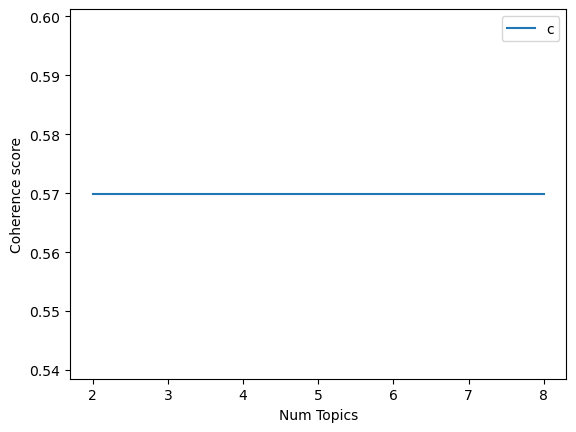

In [47]:
# Show graph

import matplotlib.pyplot as plt

limit=10; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best') #Using loc='best' is often convenient because it lets Matplotlib handle the positioning of the legend automatically, 
plt.show()



In [48]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.5699
Num Topics = 4  has Coherence Value of 0.5699
Num Topics = 6  has Coherence Value of 0.5699
Num Topics = 8  has Coherence Value of 0.5699


From the results of LDA modelling, we could see that the coherence values are the same across different number of topics generated. There are several reasons that may affect it:-
- <b>Topic overlap</b>: In trigram model, all the topics consist of overlapping word revolving around story such as quest_main_story in topic 1, amazing_story_amazing in topic 2 etc.
- <b>Data quality</b>: The data is of low quality which introduces noise in the topic modelling, making the topics generated are not coherent.


---------------------------
#### Model 2: BERTopic
BERTopic is a package for Topic Modelling using HuggingFace transformers and class-based TF-IDF. BERTopic is a highly flexible modular package so that you can tailor it to your needs.
https://maartengr.github.io/BERTopic/getting_started/quickstart/quickstart.html

## Training BERTopic model

In [49]:
# Embedding model - extract embeddings
from sentence_transformers import SentenceTransformer

embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

In [50]:
# UMAP model - reduce dimensionality
umap_model = UMAP(n_neighbors=15, n_components=5, 
                  min_dist=0.0, metric='cosine', random_state=42)

In [51]:
# HDBscan model - reduce topic outliers
hdbscan_model = HDBSCAN(min_cluster_size=10, metric='euclidean', 
                        cluster_selection_method='eom', prediction_data=True, min_samples=5)

In [52]:
# c-TF-IDF - identify the most representative words for each topic
ctfidf_model = ClassTfidfTransformer()

In [53]:
# Only need to train once, afte that can save the model using pickle
# TAKE AWHILE - 11 mins (Only need run once after that save it using topic_model.save -> Go to conclusion to view it)
steam_reviews_bert = steam_reviews_filtered2
topic_model = BERTopic(embedding_model=embedding_model, umap_model=umap_model, hdbscan_model=hdbscan_model, ctfidf_model=ctfidf_model)

topics, probs = topic_model.fit_transform(steam_reviews_bert['clean_review_str'])

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitl

In [54]:
# To save our model after training 
import pickle
pickle.dump(topic_model , open('bertopic_model.pk1' , 'wb'))

/Users/deborahhow/opt/anaconda3/envs/is217_env/lib/python3.11/site-packages/scipy/sparse/_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


In [55]:
# Load model
import pickle
topic_model = pickle.load(open('bertopic_model.pk1' , 'rb'))
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
#topic_model = BERTopic.load("./bertopic_model", embedding_model=embedding_model)

In [56]:
# Include unigram, bigram and trigram
topic_model.update_topics(steam_reviews_bert['clean_review_str'])


## Visualisations
### The topics generated were visualised using barchart, heatmap, wordcloud and Intertopic Distance

One way of visualizing the generated topics is using a barchart. The following function generates a graph that contains 15 different barcharts, each barchart represents a topic and their corresponding top 5 terms.

In [94]:
# Visualise top 15 topics and top 5 most common words for each topic
topic_model.visualize_barchart(top_n_topics =50, n_words = 5)


In [58]:
# Include unigram, bigram and trigram
topic_model.update_topics(steam_reviews_bert['clean_review_str'], n_gram_range=(1,2))
# Visualise top 15 topics and top 5 most common words for each topic
topic_model.visualize_barchart(top_n_topics =15, n_words = 5)


In [59]:
# Include unigram, bigram and trigram
topic_model.update_topics(steam_reviews_bert['clean_review_str'], n_gram_range=(1,3))
# Visualise top 15 topics and top 5 most common words for each topic
topic_model.visualize_barchart(top_n_topics =15, n_words = 5)


## Discussion

Let's take a moment to discuss some of the topics generated! If we take a closer look at topic 2, we can see that there are semantically related words combined such as 'combat', 'story' and 'system'. Based on human judgment it can be assumed that the topic concerns the combat or gameplay. Another example can be topic 4 as it contains terms such as 'music' and 'soundtrack', this can lead us to the assumption that the topic is about subject concerning music or soundtrack of the game. For topic 11, the common terms such as 'quest' and 'quest story' tells us about the story or plot of the game. For topic 13, the common terms such as 'bug' and 'glitch' tells us about the performance stability of the game whether it is buggy or not. There are other interesting topics too such as Topic 1 which talks about character in the game and topic 9 which talks about voice acting of the avatars in the game. For simplicity purposes, we only focus on these topics:-

* Topic 2: Combat/Gameplay
* Topic 4: Music/Soundtrack
* Topic 11: Story/Narrative
* Topic 13: Technical Issues

In [60]:
# to view the topics generated from BERTopic model
topic_model.get_topics()

{-1: [('get', 0.0015453987346726625),
  ('fun', 0.001492583239042812),
  ('one', 0.0014246019331033439),
  ('people', 0.001394683284783928),
  ('make', 0.001361309986765308),
  ('even', 0.0013513945335698189),
  ('ame', 0.0013347392940418759),
  ('balance', 0.0013178210276834764),
  ('still', 0.001315091762146161),
  ('team', 0.0013149220784005348)],
 0: [('water ass', 0.0020485323456418906),
  ('dog water ass', 0.0020485323456418906),
  ('ass dog water', 0.00204560362568767),
  ('water ass dog', 0.00204560362568767),
  ('ass dog', 0.0020377465950523832),
  ('dog water', 0.0019959998449395207),
  ('water', 0.001960825086371935),
  ('dog', 0.0017277561710447122),
  ('heroes', 0.0016478836982963866),
  ('new', 0.001638946372047664)],
 1: [('ban', 0.02685272510522702),
  ('get ban', 0.014983912397801202),
  ('report', 0.010664624314796744),
  ('chat', 0.007509027616536887),
  ('account', 0.0070705869752627935),
  ('ban say', 0.0053806198311821775),
  ('suspend', 0.005374236690621817),
  (

In [61]:
# topic_labels = topic_model.generate_topic_labels(nr_words=2, separator=", ")


In [62]:
# Extract the best representing documents for topic 8 which talks about characters in "The Witcher Game".
representative_docs = topic_model.get_representative_docs(3)
representative_docs

['pretty fun however issue absolutely awful management new modes ok nothing really make excite matchmaking pretty slow still usually one side remove basic feature add back update model really bad skin awfully overprice old skin take entire season earn compare couple level heroes unlock halfway bp unless pay premium version feel quite unfair almost hero shooter massive emphasis counter pick seasonal events usually bore honestly feel less interest fun events cough starwatch pve promise entire reason turn actually three missions without skill tree replay value honestly feel worse version almost every single way especially since pve feel cop main thing everyone look forward remove higher realise make money skin bundle instead actual content really suck since really fun core cant recommend anyone',
 'two complicate review core gameplay really solid decently well make team shooter regularly update balance change large roster unique character choose problem lie change model lack transparency 

In [63]:
topic_model.get_topic_info().head(19)


,Topic,Count,Name,Representation,Representative_Docs
0,-1,11843,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...
1,0,570,0_water ass_dog water ass_ass dog water_water ...,"[water ass, dog water ass, ass dog water, wate...",[two forget gift birthday entrance visual styl...
2,1,397,1_ban_get ban_report_chat,"[ban, get ban, report, chat, account, ban say,...","[ban reason, get ban reason, get ban reason]"
3,2,386,2_addict_need help need_help need help_help need,"[addict, need help need, help need help, help ...","[addict, addict, addict help]"
4,3,332,3_battle pass_pass_new_battle,"[battle pass, pass, new, battle, pay, skin, bu...",[pretty fun however issue absolutely awful man...
5,4,258,4_ames_fun ames_ames ames_ames fun,"[ames, fun ames, ames ames, ames fun, ames get...","[ames fun, fun ames, ames ames]"
6,5,224,5_rank_rank system_system_lose,"[rank, rank system, system, lose, win, lose ra...","[dont rank, rank system suck, rank system bad]"
7,6,220,6_trash_garbage_trash trash_garbage trash,"[trash, garbage, trash trash, garbage trash, t...","[trash, trash, trash]"
8,7,193,7_matchmaking_worst matchmaking_worst_matchmak...,"[matchmaking, worst matchmaking, worst, matchm...","[worst matchmaking ame, worst matchmaking, mat..."
9,8,186,8_negative review_negative_review_positive review,"[negative review, negative, review, positive r...",[negative review people get give bad review ne...


The topic with -1 are outliers which could not be clustered. In the Name column, it consists of the topic ID and also the words that are the most representative of the topic.The biggest group is Topic -1 , which corresponds to outliers. It was also noted that a large number of feedback comments were short and lacked substantial information. As a result, many of these comments were grouped into a topic labeled "Topic -1." This topic was characterized by feedback that could not be easily categorized into any of the other distinct topics identified by the model. 

By default, BERTopic uses HDBSCAN for clustering, and it doesn’t force all data points to be part of clusters


In [92]:
# Return top n words for a specific topic and their c-TF-IDF scores
topic_model.get_topic(9)


[('skin', 0.027126971109561773),
 ('price', 0.008979969758086846),
 ('buy skin', 0.008193064866780682),
 ('expensive', 0.007929001613382818),
 ('weapon skin', 0.007888667334318748),
 ('buy', 0.007684211958301592),
 ('skin cost', 0.007002090916226457),
 ('overprice', 0.006411819410329334),
 ('sell', 0.006284534896712315),
 ('skin price', 0.006004009596042467)]

Using .get_document_info, we can also extract information on a document level, such as their corresponding topics, probabilities, whether they are representative documents for a topic, etc.:

In [65]:
# Another method customization for the n-gram reviews if never use update_topics
# from sklearn.feature_extraction.text import CountVectorizer
# vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 5))
# topic_model.update_topics(steam_reviews_bert['clean_review_str'], vectorizer_model=vectorizer_model)

In [66]:
topic_model.get_document_info(steam_reviews_bert['clean_review_str'])
# type(topic_model)


,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,make two pve scrap pve basically show real rea...,-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.000000,False
1,alright let us actually provide constructive r...,-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.000000,False
2,hours battle net think still one purchase long...,-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.000000,False
3,hi short review explain happen since almost si...,0,0_water ass_dog water ass_ass dog water_water ...,"[water ass, dog water ass, ass dog water, wate...",[two forget gift birthday entrance visual styl...,water ass - dog water ass - ass dog water - wa...,1.000000,False
4,nsfw community take care overpricedgamepass on...,-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.000000,False
...,...,...,...,...,...,...,...,...
33734,whyd,254,254_reason reason_reason_reason reason reason_uh,"[reason reason, reason, reason reason reason, ...","[reason, reason, reason]",reason reason - reason - reason reason reason ...,1.000000,False
33735,sell soul add library,111,111_soul_sell soul_sell_suck soul,"[soul, sell soul, sell, suck soul, soulless, s...","[take soul, want soul back, soul suck]",soul - sell soul - sell - suck soul - soulless...,1.000000,False
33736,matchmaking season cant keep server run crash ...,-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.000000,False
33737,cannot fathom hatred towards hero know sombra ...,11,11_sombra_remove sombra_sombra remove sombra_s...,"[sombra, remove sombra, sombra remove sombra, ...","[sombra hate, sombra still, sombra still]",sombra - remove sombra - sombra remove sombra ...,0.383751,False


In [67]:
steam_reviews_bert.to_csv('./topic_modelling_BERTopic.csv')

Which topics are related? Using Heatmap to visualise it

In [68]:
topic_model.visualize_heatmap(n_clusters=10)

<b> -- Documents and topics -- </b>
- Creating an overview of the relationship between documents and topic

In [69]:
#Visualize topics, their sizes, and their corresponding words
topic_model.visualize_topics(top_n_topics = 10)


## Wordcloud Visualisation
Using wordcloud to display the most common words for the topic input

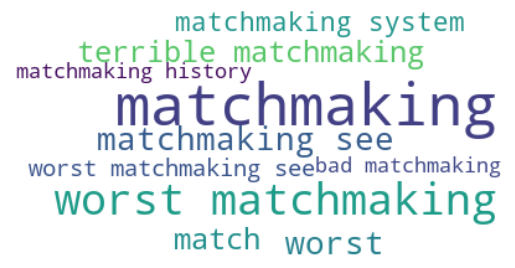

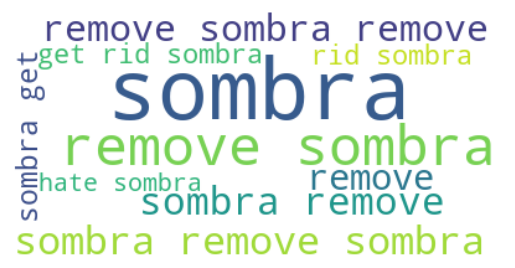

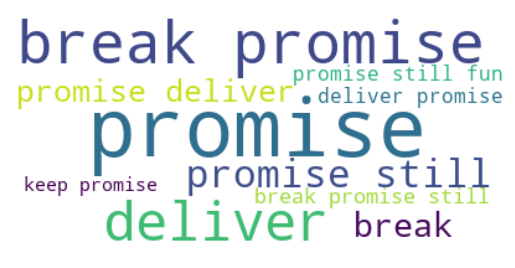

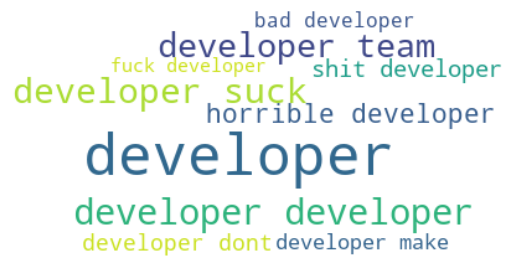

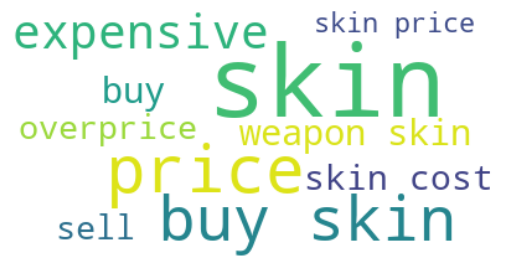

<Figure size 640x480 with 0 Axes>

In [93]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, 7)
create_wordcloud(topic_model, 11)
create_wordcloud(topic_model, 19)
create_wordcloud(topic_model, 14)
create_wordcloud(topic_model, 9)

# topics = topic_model.get_topics(1)
# for i, topic in enumerate(topics):
#     create_wordcloud(topic_model, topic=i)
    
plt.tight_layout()
plt.show()

### BERTopic Model Evaluation ###

In [71]:
from gensim.models.coherencemodel import CoherenceModel

# print(len(topics))

documents =  pd.DataFrame({"Document": steam_reviews_bert['clean_review_str'],
                          "ID": range(len(steam_reviews_bert['clean_review_str'])),
                          "Topic": topics})
# Topic 2 is Gameplay
documents[documents['Topic'] == 2]

,Document,ID,Topic
148,meth thing need keep come back hit high howeve...,148,2
974,steal dopamine receptors flog streets scrap fa...,974,2
1244,biggest piece dogshit invent dogshit yet reaso...,1244,2
1463,one hours suck addict cannot stop even start g...,1463,2
1510,addict gameplay monetization community drug ad...,1510,2
...,...,...,...
33646,bad addict fun ur friends try comp alone,33646,2
33667,regretfully addict two hours precious life dea...,33667,2
33708,watch friend smoke crack make every bad decisi...,33708,2
33716,think drug addict healthy,33716,2


In [72]:
documents_per_topic = documents.groupby(['Topic'], as_index=False).agg({'Document': ' '.join})
cleaned_docs = topic_model._preprocess_text(documents_per_topic.Document.values)


In [73]:
import gensim.corpora as corpora
vectorizer_model = CountVectorizer(stop_words="english")

# Extract vectorizer and analyzer from BERTopic
vectorizer = topic_model.vectorizer_model
analyzer = vectorizer.build_analyzer()

# Extract features for Topic Coherence evaluation
# vectorizer_model = CountVectorizer(stop_words="english")
# words = vectorizer.get_feature_names()
tokens = [analyzer(doc) for doc in cleaned_docs]
dictionary = corpora.Dictionary(tokens)
corpus = [dictionary.doc2bow(token) for token in tokens]
topic_words = [[words for words, _ in topic_model.get_topic(topic)] 
               for topic in range(len(set(topics))-1)]

# Evaluate
coherence_model = CoherenceModel(topics=topic_words, 
                                 texts=tokens, 
                                 corpus=corpus,
                                 dictionary=dictionary, 
                                 coherence='c_v')
coherence = coherence_model.get_coherence()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [74]:
print(coherence)

0.4683030206267191


In [86]:
embedding_model = "bertopic_model2"
topic_model.save("bertopic_model2", serialization="safetensors", save_ctfidf=True, save_embedding_model=embedding_model)

In [91]:
topic_model.get_topic(14)

[('developer', 0.05173931247790257),
 ('developer developer', 0.013344528718778113),
 ('developer suck', 0.01220334851546825),
 ('developer team', 0.010994091045643447),
 ('horrible developer', 0.01091654998524923),
 ('shit developer', 0.009713435826428056),
 ('developer dont', 0.009578837326770043),
 ('developer make', 0.00857706301040229),
 ('bad developer', 0.008050750431515616),
 ('fuck developer', 0.007890969585292316)]

In [95]:
ow2_df = pd.read_csv('./topic_modelling_BERTopic.csv', index_col=0)

In [96]:
ow2_df.head()

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,review_length,clean_review,clean_review_str,bigram_review,trigram_review
0,english,Made Overwatch 2 because of PvE.\nScrapped PvE...,2024-04-17,2024-04-17,0.0,0,76561198003147811,10.850000,27,"['make', 'two', 'pve', 'scrap', 'pve', 'basica...",make two pve scrap pve basically show real rea...,"['make_two', 'two_pve', 'pve_scrap', 'scrap_pv...","['make_two_pve', 'two_pve_scrap', 'pve_scrap_p..."
1,english,"Alright, let's actually provide a constructive...",2024-03-18,2024-03-18,0.0,39,76561198091551412,105.516667,1392,"['alright', 'let', 'us', 'actually', 'provide'...",alright let us actually provide constructive r...,"['alright_let', 'let_us', 'us_actually', 'actu...","['alright_let_us', 'let_us_actually', 'us_actu..."
2,english,I have over 300 hours in Battle.net. \n\nI lov...,2023-08-13,2023-08-13,0.0,0,76561198109916021,8.816667,105,"['hours', 'battle', 'net', 'think', 'still', '...",hours battle net think still one purchase long...,"['hours_battle', 'battle_net', 'net_think', 't...","['hours_battle_net', 'battle_net_think', 'net_..."
3,english,"Hi, a not-so-short review explaining what happ...",2023-10-06,2023-11-04,0.0,65,76561198046201053,98.016667,586,"['hi', 'short', 'review', 'explain', 'happen',...",hi short review explain happen since almost si...,"['hi_short', 'short_review', 'review_explain',...","['hi_short_review', 'short_review_explain', 'r..."
4,english,[h1][b]The NSFW community takes better care of...,2023-08-21,2023-08-21,0.0,0,76561198060615441,21.300000,86,"['nsfw', 'community', 'take', 'care', 'overpri...",nsfw community take care overpricedgamepass on...,"['nsfw_community', 'community_take', 'take_car...","['nsfw_community_take', 'community_take_care',..."


In [97]:
ow2_df.drop(columns=['timestamp_created', 'review_length', 'clean_review', 'clean_review_str'], inplace=True)

In [ ]:
df_topics = pd.DataFrame(topic_model.get_document_info(ow2_df['review']))

mapping = {7 : 'Matchmaking', 9: 'Expensive', 11: 'Sombra', 14: 'Developer', 19:'Failed Promise'}

# Replace values in the 'Topic' column
df_topics['Topic'] = df_topics['Topic'].replace(mapping)

# df_topics[df_topics['Topic'] == 'Audio Reliability']['Document'].iloc[:]

df_topics.head()

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,Made Overwatch 2 because of PvE.\nScrapped PvE...,-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.0,False
1,"Alright, let's actually provide a constructive...",-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.0,False
2,I have over 300 hours in Battle.net. \n\nI lov...,-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.0,False
3,"Hi, a not-so-short review explaining what happ...",0,0_water ass_dog water ass_ass dog water_water ...,"[water ass, dog water ass, ass dog water, wate...",[two forget gift birthday entrance visual styl...,water ass - dog water ass - ass dog water - wa...,1.0,False
4,[h1][b]The NSFW community takes better care of...,-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.0,False


In [101]:
df_merge = pd.merge(ow2_df,df_topics, how='inner', left_on = 'review', right_on = 'Document') 
df_merge = df_merge.drop('Document', axis=1)
df_merge.head()

,language,review,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,bigram_review,trigram_review,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,english,Made Overwatch 2 because of PvE.\nScrapped PvE...,2024-04-17,0.0,0,76561198003147811,10.850000,"['make_two', 'two_pve', 'pve_scrap', 'scrap_pv...","['make_two_pve', 'two_pve_scrap', 'pve_scrap_p...",-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.0,False
1,english,"Alright, let's actually provide a constructive...",2024-03-18,0.0,39,76561198091551412,105.516667,"['alright_let', 'let_us', 'us_actually', 'actu...","['alright_let_us', 'let_us_actually', 'us_actu...",-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.0,False
2,english,"Alright, let's actually provide a constructive...",2024-03-18,0.0,39,76561198091551412,105.516667,"['alright_let', 'let_us', 'us_actually', 'actu...","['alright_let_us', 'let_us_actually', 'us_actu...",-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.0,False
3,english,"Alright, let's actually provide a constructive...",2024-03-18,0.0,39,76561198091551412,105.516667,"['alright_let', 'let_us', 'us_actually', 'actu...","['alright_let_us', 'let_us_actually', 'us_actu...",-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.0,False
4,english,"Alright, let's actually provide a constructive...",2024-03-18,0.0,39,76561198091551412,105.516667,"['alright_let', 'let_us', 'us_actually', 'actu...","['alright_let_us', 'let_us_actually', 'us_actu...",-1,-1_get_fun_one_people,"[get, fun, one, people, make, even, ame, balan...",[look negative review aside actually fine key ...,get - fun - one - people - make - even - ame -...,0.0,False


In [103]:
ow2_5topics = df_merge[df_merge['Topic'].isin(['Matchmaking', 'Failed Promise', 'Expensive', 'Sombra', 'Developer'])].reset_index(drop=True)
# Rename column Document to review
ow2_5topics.rename(columns={'Document': 'review'}, inplace=True)
ow2_5topics.head(100)


,language,review,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,bigram_review,trigram_review,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,english,This really is a game that is not good for you...,2023-10-16,0.0,8,76561198426916437,5.066667,"['really_mental', 'mental_health', 'health_mat...","['really_mental_health', 'mental_health_matchm...",Matchmaking,7_matchmaking_worst matchmaking_worst_matchmak...,"[matchmaking, worst matchmaking, worst, matchm...","[worst matchmaking ame, worst matchmaking, mat...",matchmaking - worst matchmaking - worst - matc...,1.000000,False
1,english,"got almost 900 hours, its a good game but want...",2024-07-10,0.0,0,76561198413080751,86.166667,"['get_almost', 'almost_hours', 'hours_want', '...","['get_almost_hours', 'almost_hours_want', 'hou...",Expensive,9_skin_price_buy skin_expensive,"[skin, price, buy skin, expensive, weapon skin...",[change color old skin charge dollars also mak...,skin - price - buy skin - expensive - weapon s...,0.230906,False
2,english,The skins are good.\nThey cost too much. \n\nB...,2024-06-21,0.0,1,76561198101681894,355.000000,"['skin_cost', 'cost_much', 'much_want', 'want_...","['skin_cost_much', 'cost_much_want', 'much_wan...",Expensive,9_skin_price_buy skin_expensive,"[skin, price, buy skin, expensive, weapon skin...",[change color old skin charge dollars also mak...,skin - price - buy skin - expensive - weapon s...,0.226672,False
3,english,this game is horrible i load into any round an...,2024-01-08,0.0,0,76561198304704423,25.266667,"['horrible_load', 'load_round', 'round_get', '...","['horrible_load_round', 'load_round_get', 'rou...",Sombra,11_sombra_remove sombra_sombra remove sombra_s...,"[sombra, remove sombra, sombra remove sombra, ...","[sombra hate, sombra still, sombra still]",sombra - remove sombra - sombra remove sombra ...,0.241103,False
4,english,I bought the game and after its transition to ...,2023-08-21,1.0,1,76561198189115163,31.133333,"['buy_transition', 'transition_free', 'free_ge...","['buy_transition_free', 'transition_free_get',...",Expensive,9_skin_price_buy skin_expensive,"[skin, price, buy skin, expensive, weapon skin...",[change color old skin charge dollars also mak...,skin - price - buy skin - expensive - weapon s...,0.448012,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,english,"Game will be way better if they removed zarya,...",2023-10-05,0.0,0,76561198988320408,36.283333,"['way_remove', 'remove_zarya', 'zarya_pharah',...","['way_remove_zarya', 'remove_zarya_pharah', 'z...",Sombra,11_sombra_remove sombra_sombra remove sombra_s...,"[sombra, remove sombra, sombra remove sombra, ...","[sombra hate, sombra still, sombra still]",sombra - remove sombra - sombra remove sombra ...,0.237318,False
96,english,"Coming from a tf2 diehard, this game had a red...",2024-03-27,1.0,0,76561199060858822,26.733333,"['come_diehard', 'diehard_redemption', 'redemp...","['come_diehard_redemption', 'diehard_redemptio...",Sombra,11_sombra_remove sombra_sombra remove sombra_s...,"[sombra, remove sombra, sombra remove sombra, ...","[sombra hate, sombra still, sombra still]",sombra - remove sombra - sombra remove sombra ...,0.489060,False
97,english,it's ok... the matchmaking system is like the ...,2023-12-06,1.0,0,76561198000541290,122.650000,"['ok_matchmaking', 'matchmaking_system', 'syst...","['ok_matchmaking_system', 'matchmaking_system_...",Matchmaking,7_matchmaking_worst matchmaking_worst_matchmak...,"[matchmaking, worst matchmaking, worst, matchm...","[worst matchmaking ame, worst matchmaking, mat...",matchmaking - worst matchmaking - worst - matc...,0.246712,False
98,english,Thank you Blizzard/Activision for granting me ...,2023-08-12,0.0,0,76561198044285645,3.083333,"['activision_grant', 'grant_opportunity', 'opp...","['activision_grant_opportunity', 'grant_opport...",Expensive,9_skin_price_buy skin_expensive,"[skin, price, buy skin, expensive

In [104]:
ow2_5topics.to_csv('./topic_modelling_BERTopic.csv')

# Conclusion

In [75]:
# # Saving the model (BERTopic):
# embedding_model = "bertopic_model"
# topic_model.save("/Users/ahminhui/Desktop/Text Mining/Project/Final/bertopic_model", serialization="safetensors", save_ctfidf=True, save_embedding_model=embedding_model)

In [76]:
# steam_reviews_bert.to_csv('./topic_modelling.csv')

# Validation using Test data

### Test 1

In [77]:
text = "The soundtrack is playful, dramatic, tragic, serene, unsettling, and epic all at once. Music that has the ability to convey the emotions of a story, and then enhance the listeners experience of the game is what makes a good soundtrack. The Witcher 3 soundtrack does both these things incredibly well.."
preds, probs = topic_model.transform(text)
print(preds)

[-1]


In [78]:
top_topic = preds[0]
print(topic_model.get_topic(top_topic))

[('get', 0.0015453987346726625), ('fun', 0.001492583239042812), ('one', 0.0014246019331033439), ('people', 0.001394683284783928), ('make', 0.001361309986765308), ('even', 0.0013513945335698189), ('ame', 0.0013347392940418759), ('balance', 0.0013178210276834764), ('still', 0.001315091762146161), ('team', 0.0013149220784005348)]


In [79]:
topic_model.get_topic_info(4)

,Topic,Count,Name,Representation,Representative_Docs
0,4,258,4_ames_fun ames_ames ames_ames fun,"[ames, fun ames, ames ames, ames fun, ames get...","[ames fun, fun ames, ames ames]"


## To verify if this is existing review in the dataset.

In [80]:
steam_reviews_filtered2[steam_reviews_filtered2['review'] == "The soundtrack is playful, dramatic, tragic, serene, unsettling, and epic all at once. Music that has the ability to convey the emotions of a story, and then enhance the listeners experience of the game is what makes a good soundtrack. The Witcher 3 soundtrack does both these things incredibly well.."]

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,review_length,clean_review,clean_review_str,bigram_review,trigram_review


### To ensure a fair test, the review is not being trained before! So, it is a new data point. It did well in predicting the topic which is Soundtrack!

### Test 2

In [81]:
text = "This game is so buggy. I am not going to play it anymore! Wasted my money and time on this stupid game"
preds, probs = topic_model.transform(text)
print(preds)

[-1]


In [82]:
topic_model.get_topic_info(13)

,Topic,Count,Name,Representation,Representative_Docs
0,13,169,13_review_negative review_negative_review bomb,"[review, negative review, negative, review bom...",[ow bad narrative review actual ame around hou...


## To verify if this is existing review in the dataset.

In [83]:
steam_reviews_filtered2[steam_reviews_filtered2['review'] == "This game is so buggy. I am not going to play it anymore! Wasted my money and time on this stupid game" ]

,language,review,timestamp_created,timestamp_updated,voted_up,comment_count,author.steamid,author.playtime_at_review,review_length,clean_review,clean_review_str,bigram_review,trigram_review


### To ensure a fair validation, the review is not being trained before! So, it is a new data point. It did well in predicting the topic which is Technical Issues!